In [1]:
import numpy as np
import pandas as pd
import pylab as plt
from sklearn.datasets import make_classification
%pylab inline
import seaborn as sns
sns.set_style('whitegrid')
pylab.rcParams['figure.figsize'] = (12.0, 5.0)

import warnings
warnings.filterwarnings('ignore')

Populating the interactive namespace from numpy and matplotlib


C:\Users\User11\anaconda3\lib\site-packages\IPython\core\magics\pylab.py:159: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [2]:
from sklearn import svm
from sklearn.svm import SVC
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_blobs
from sklearn.preprocessing import PolynomialFeatures
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

# Линейное напоминание SVM

Давайте рассмотрим проблему бинарной классификации. Обучающие выборки задаются по 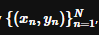
, где
N — количество объектов,
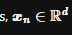 — вектор признаков объекта,
 — класс объекта.

Модель SVM-поездов для разделения гиперплоскости:
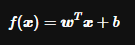 

Параметры модели — вектор весов и смещения 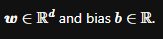.


Обучение осуществляется путем решения задачи оптимизации:
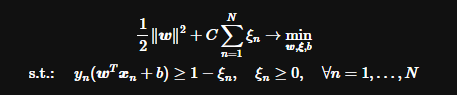




Ограничение 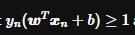
гарантирует правильную классификацию объектов путем разделения гиперплоскости. Поскольку на практике выборка не может быть линейно разделяемой, вводятся переменные slack , что ослабляет условие правильной классификации.  называйте за малую ширину поля, 
называйте за ослабление ограничений.


Решение задачи оптимизации задается  тем, что некоторые из ограничений становятся активными, т.е. становятся точным равенством: 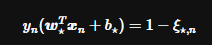
Объекты, соответствующие вызываемым активным ограничениям опорными векторами.

Гиперпараметр C отвечает за балансировку ширины поля и ошибок, допускаемых классификатором. Это показывает обобщающее свойство разделяющей гиперплоскости - большие значения C соответствуют меньшей обобщающей способности и могут привести к переобучению, если данные хорошо описываются линейной моделью. Чтобы выбрать C, необходимо выполнить перекрестную проверку в наборе проверки, чтобы найти наилучшее значение.

## Реализация

В sklearn есть две реализации линейного SVM: LinearSVC и SVC с линейным ядром. Они основаны на разных библиотеках, с решением проблемы оптимизации liblinear в первом случае и libsvm во втором.

Здесь мы будем использовать sklearn.svm.SVC с kernel='linear'.

Мы генерируем выборки данных с помощью:

- линейно разделяемые классы
- с хорошо разделяемыми классами, но не линейно
- с неотделимыми классами.


Приведенная ниже функция обеспечивает визуализацию и данные образцов креатинона. Ваша задача - использовать ее в соответствии со следующими упражнениями.

In [3]:
# Из примеров sklearn SVC
def svc_plotter(classifiers, name, poly_f=False, polynomial_expand=None):
    h = .02  # размер шага в сетке
        
    X_sep, y_sep = make_blobs(n_samples=400, n_features=2, centers=2, cluster_std=1.5, random_state=42)
    linearly_separable = (X_sep, y_sep)

    X, y = make_classification(n_samples=400, n_features=2, n_redundant=0, n_informative=2,
                               random_state=231, n_clusters_per_class=1)

    rng = np.random.RandomState(2)
    X += 15 * rng.uniform(size=X.shape)
    linearly_bad_separable = (X, y)


    datasets = [linearly_separable,
                linearly_bad_separable,
                make_circles(n_samples=400, noise=0.05, random_state=42)]

    # перебираем наборы данных
    f, axes = plt.subplots(len(datasets), len(classifiers), figsize=(20, 20))
    for ds_cnt, ds in enumerate(datasets):
        # предварительно обработать набор данных, разделенный на обучающую и тестовую части
        X, y = ds
        X = StandardScaler().fit_transform(X)
        X_train, X_test, y_train, y_test = \
            train_test_split(X, y, test_size=.4, random_state=42)

        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))
        # перебираем классификаторы
        index = 0
        for clf in classifiers:
            if poly_f:
                clf.fit(polynomial_expand.fit_transform(X_train), y_train)
            else:
                clf.fit(X_train, y_train)
            ax = axes[ds_cnt, index]
            index += 1

            # Постройте границу решения. Для этого мы назначим цвет каждому
            # точка в сетке [x_min, x_max]x[y_amin, y_max].
            if hasattr(clf, "decision_function"):
                if poly_f:
                    Z = clf.decision_function(polynomial_expand.transform(np.c_[xx.ravel(), yy.ravel()]))
                else:
                    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
            else:
                Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
            # Поместите результат в цветной график
            Z = Z.reshape(xx.shape)
            #ax.pcolormesh(xx, yy, Z > 0, cmap=plt.cm.Paired)
            ax.contourf(xx, yy, Z, cmap=cm.RdBu, alpha=.8, linestyles=['--', '-', '--'],levels=[-1, 0, 1])
            ax.contour(xx, yy, Z, colors=['k', 'k', 'k'], linestyles=['--', '-', '--'], levels=[-1, 0, 1])

            #векторы поддержки
#             ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=80,
#                     facecolors='none', zorder=10)

            if poly_f:
                poly_features= polynomial_expand.fit_transform(X_train)
                train_classes = [poly_features[~y_train.astype(bool)], poly_features[y_train.astype(bool)]] 
            else:
                train_classes = [X_train[~y_train.astype(bool)], X_train[y_train.astype(bool)]] 
            
            ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=180,
                    facecolors='none', zorder=10, edgecolors='black', linewidths=0.5)
            # Нанесите также тренировочные точки
            ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, alpha=0.3, s=36)
            # и точки тестирования
            ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                       alpha=0.5, s=36)

            ax.set_xlim(xx.min(), xx.max())
            ax.set_ylim(yy.min(), yy.max())
            ax.set_xlabel("x_1")
            ax.set_ylabel("x_2")
            ax.set_title(name[index - 1])

# Задание 1

Измените параметр C (в логарифмическом масштабе) и предоставьте список SVM с линейным ядром для работы. имя - это список строк, обозначающих различные метки(значения c)

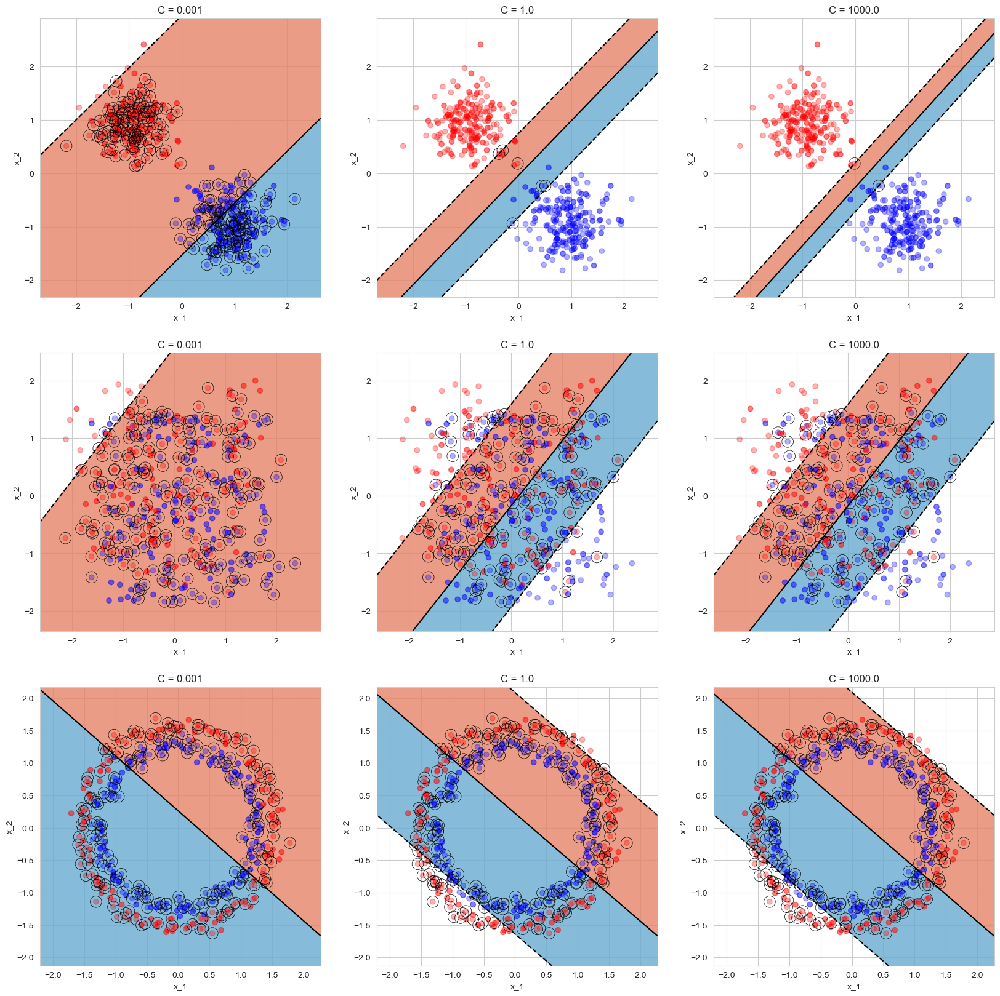

In [5]:
'''Это создаст список классификаторов SVM с разными значениями C и 
соответствующими им метками в списке имен. Затем можно вызвать функцию svc_plotter 
с этими списками в качестве аргументов для построения границ решений для каждого классификатора.'''
classifiers = []
name = []

# Создаем список значений параметра C в логарифмической шкале
# массив из 3 значений
# -3 начальное значение логарифма
# 3 конечное значение логарифма

C_list = np.logspace(-3, 3, num = 3)
for C in C_list: 
# YOUR CODE HERE 
    classifiers.append(SVC(kernel = 'linear', C = C))
    name.append('C = {}'.format(C))
    
svc_plotter(classifiers, name)

# Задача 2

Как количество опорных векторов зависит от C в разных наборах данных? Извлеките информацию о опорных векторах из SVC и постройте график: количество опорных векторов в зависимости от значения C для всех 3 наборов данных, объявленных ниже.


In [6]:
X_sep, y_sep = make_blobs(n_samples=400, n_features=2, centers=2, cluster_std=1.5, random_state=42)
linearly_separable = (X_sep, y_sep)

X, y = make_classification(n_samples=400, n_features=2, n_redundant=0, n_informative=2,
                           random_state=231, n_clusters_per_class=1)

# создает генератор случайных чисел rng с начальным состоянием 2. Это нужно для того, чтобы при каждом запуске программы 
# генерировались одни и те же случайные числа
rng = np.random.RandomState(2)
# добавляет к каждому элементу массива X случайное число из равномерного распределения на интервале 0, 1 и умноженное на 15
# Таким образом, каждый элемент массива X увеличивается на случайное значение из диапазона 0, 15
X += 15 * rng.uniform(size=X.shape)
# создает кортеж, который содержит массив X и y. Массив y содержит метки классов для каждого элемента массива X. В данном
# случае, массив y содержит только два класса 0 и 1
linearly_bad_separable = (X, y)


datasets = [linearly_separable,
            linearly_bad_separable,
            make_circles(n_samples=400, noise=0.05, random_state=42)]

In [17]:
vectors = [] # список в который будем добавлять кортежи, содержащие количество опорных векторов 
paramd_grid = np.logspace(-3, 3, num = 10)
for dataset in datasets:  
    # YOUR CODE HERE
    num_vectors = [] # количество опорных векторов для каждого параметра С
    for C in paramd_grid:
        clf = SVC(C = C)
        clf.fit(dataset[0], dataset[1])
        num_vectors.append(len(clf.support_vectors_))
    # YOUR CODE HERE
    vectors.append(num_vectors)

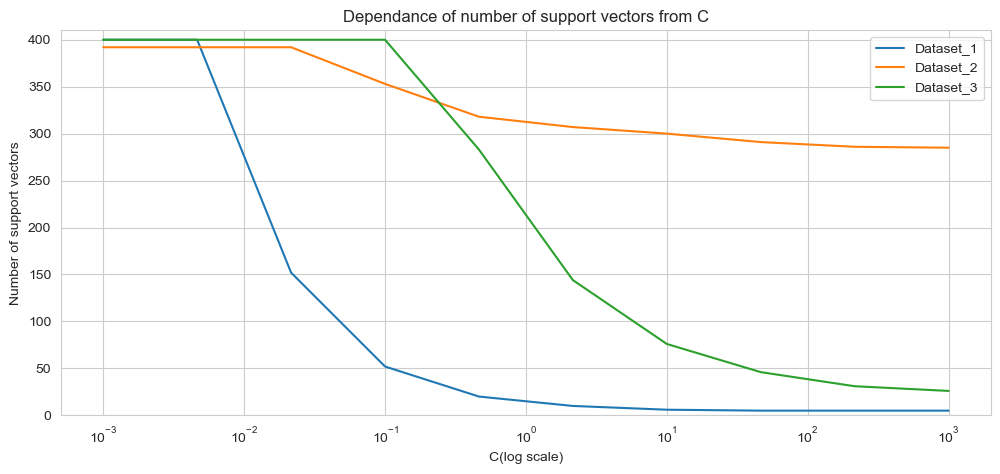

In [18]:
plt.figure
plt.plot(paramd_grid, vectors[0], label = 'Dataset_1')
plt.plot(paramd_grid, vectors[1], label = 'Dataset_2')
plt.plot(paramd_grid, vectors[2], label = 'Dataset_3')
plt.xscale('log')
plt.xlabel('C(log scale)')
plt.ylabel('Number of support vectors')
plt.ylim(0, 410)
plt.title("Dependance of number of support vectors from C")
plt.legend()

# Задание 3

Как вы можете видеть, для набора данных 3 нет линейной гиперплоскости (например, классы не могут быть разделены гиперплоскостью), таким образом, чтобы решить эту проблему, можно изменить пространство объектов, в котором линейная модель лучше описывает набор данных. 

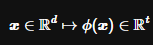

Например, добавление всего попарного произведения функций: 
преобразуем в пространство, где линейная гиперплоскость является квадратичной формой в исходном пространстве объектов.


Помните expand(X) со вчерашнего дня? В sklearn есть модуль, который сделает это за вас, и не только. Взгляните на это.

Используйте  и отобразите результа ты, как указано выше. Кратко опишите результаты

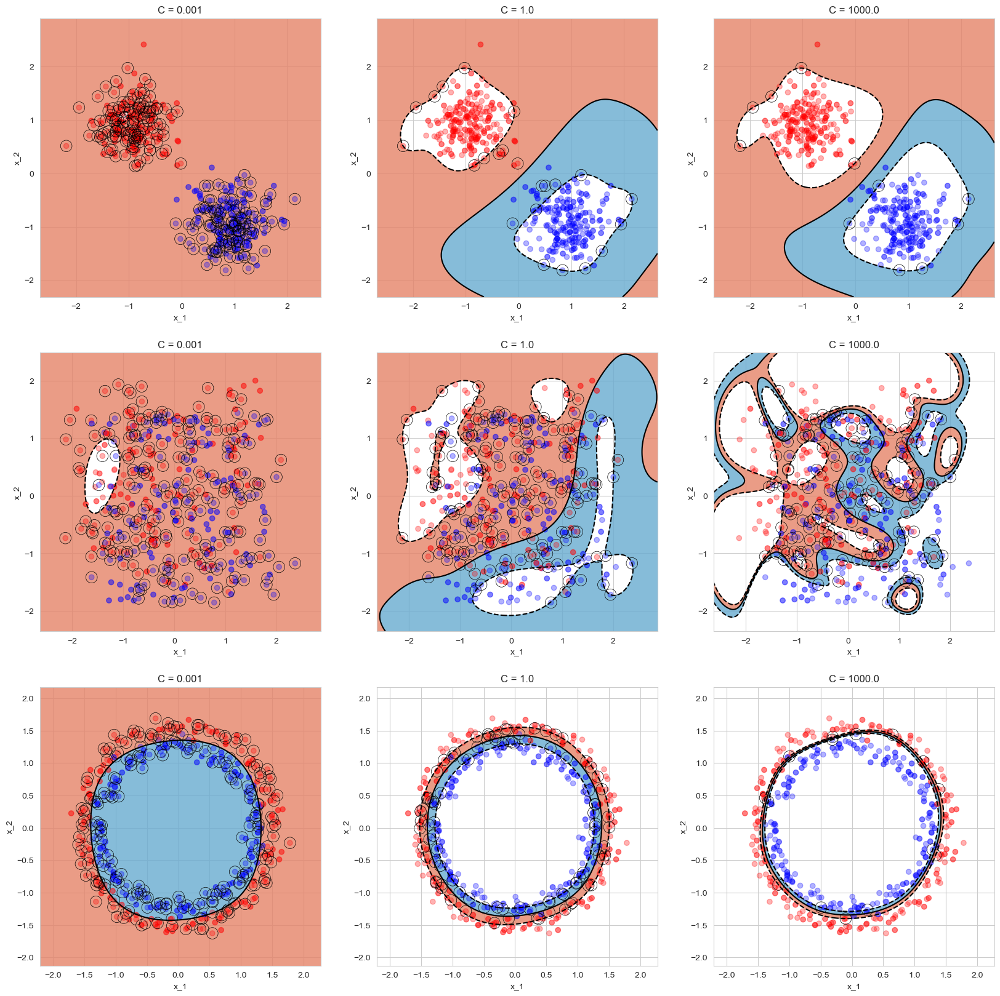

In [19]:
classifiers =  []
name = []

C_list = np.logspace(-3, 3, num = 3)

# YOUR CODE HERE 
for C in C_list:
    classifiers.append(SVC(C = C))
    name.append('C = {}'.format(C))
    
svc_plotter(classifiers, name, poly_f=True, polynomial_expand = PolynomialFeatures(include_bias = False))

# Ядро SVM

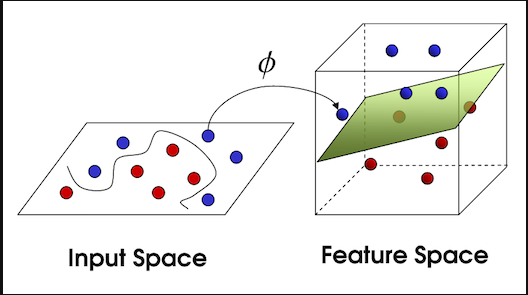

Проблема Linaer SVM, рассмотренная выше, обычно называется двойной проблемой прямой оптимизации. Любая прямая задача имеет
проблему, и в некоторых случаях оптимумы обеих задач совпадают.

Двойная проблема для SVM заключается в:
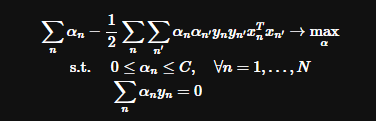


Оптимизируется вектор двойственных переменных . Объект  является SV, если .

Прогнозируемая метка задается с помощью:
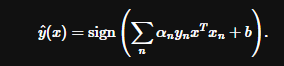

## Трюк с ядром

Обратите внимание, что двойная задача имеет объекты только в виде скалярного произведения . Это наблюдение помогает нам выполнить трюк ядра - неявно изменить пространство объектов. Вместо вычисления  (как мы делали раньше) мы вычислим скалярное произведение 
called kernel и подключим его вместо  указанного выше.

# Задача 4

Попробуйте другое ядро SVM и постройте изображения, как указано выше, посмотрите, какие еще параметры есть у ядер и как они влияют на результаты.

многочлен:
- с разными 
- Гауссовский RBF: 

Полиядро

degree=2


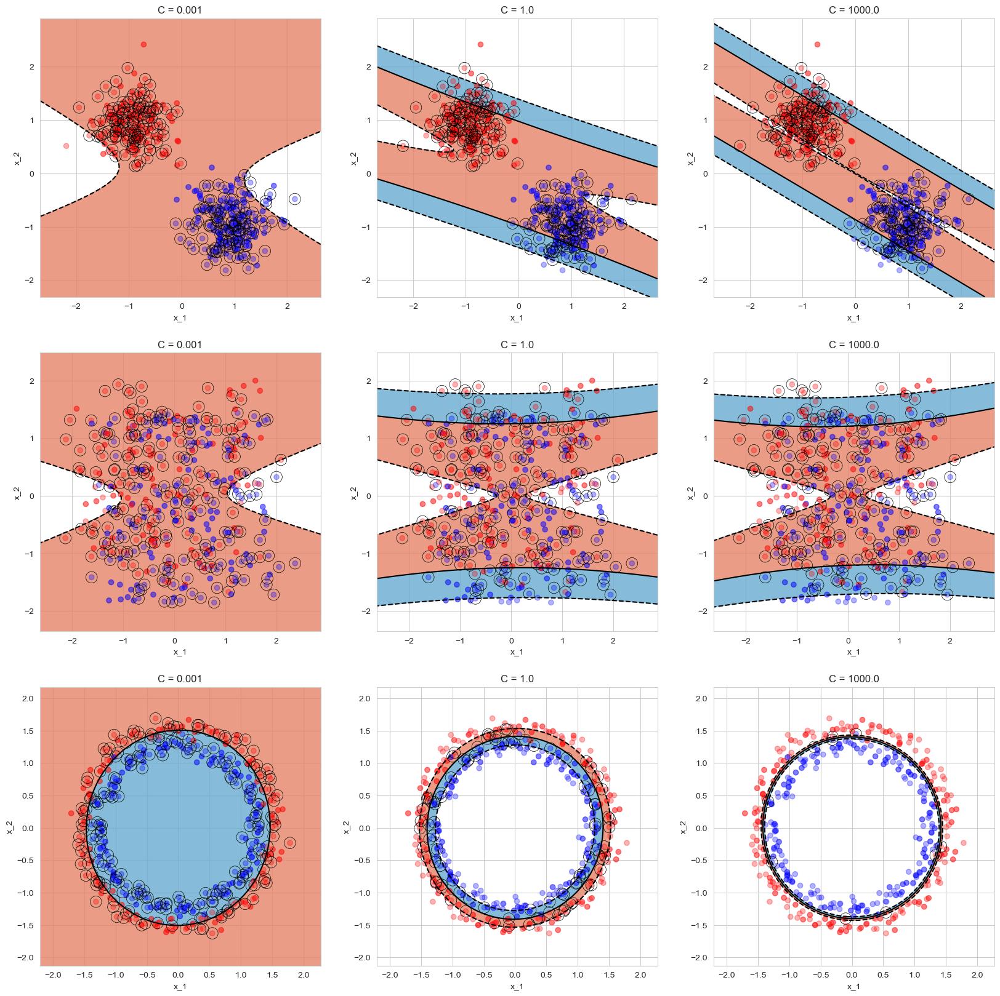

In [20]:
classifiers = []
name = []

C_list = np.logspace(-3, 3, num = 3)

# YOUR CODE HERE
for C in C_list:
    clf = SVC(kernel = 'poly', degree = 2, C = C)
    classifiers.append(clf)
    name.append('C = {}'.format(C))
    
svc_plotter(classifiers, name)

degree=5

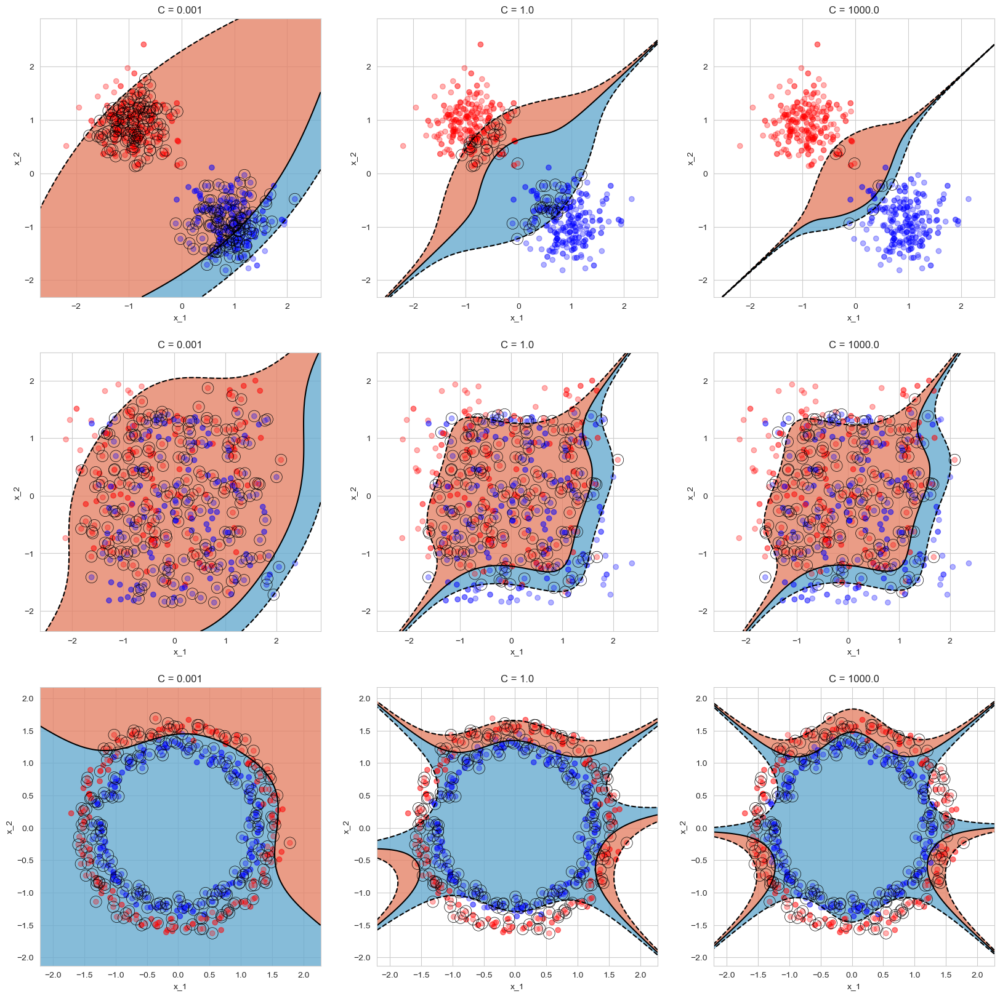

In [21]:
classifiers = []
name = []

C_list = np.logspace(-3, 3, num = 3)

# YOUR CODE HERE
for C in C_list:
    clf = SVC(kernel = 'poly', degree = 5, C = C)
    classifiers.append(clf)
    name.append('C = {}'.format(C))
    
svc_plotter(classifiers, name)

degree=10

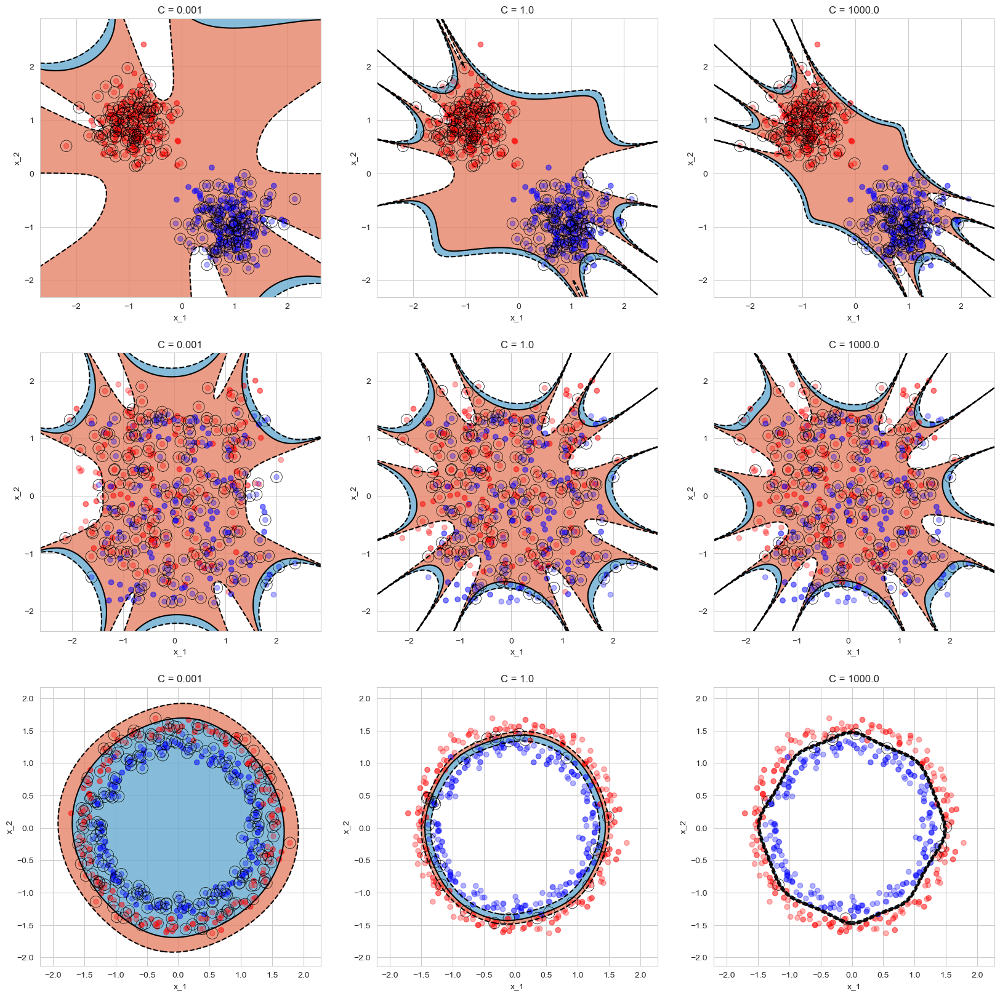

In [22]:
classifiers = []
name = []

C_list = np.logspace(-3, 3, num = 3)

# YOUR CODE HERE
for C in C_list:
    clf = SVC(kernel = 'poly', degree = 10, C = C)
    classifiers.append(clf)
    name.append('C = {}'.format(C))
    
svc_plotter(classifiers, name)

# Ядро RBF (измените параметр gamma в logscale)

Параметр gamma в SVM с радиальным базисным функциональным ядром (RBF) определяет, как далеко влияют одиночные образцы на формирование границы решения. Более конкретно, gamma определяет, как быстро расходится функция ядра RBF, когда расстояние между двумя точками увеличивается.

Если увеличить значение gamma, то граница решения будет более "неровной" и "сложной", что может привести к переобучению модели. Если уменьшить значение gamma, то граница решения будет более "гладкой" и "простой", что может привести к недообучению модели.

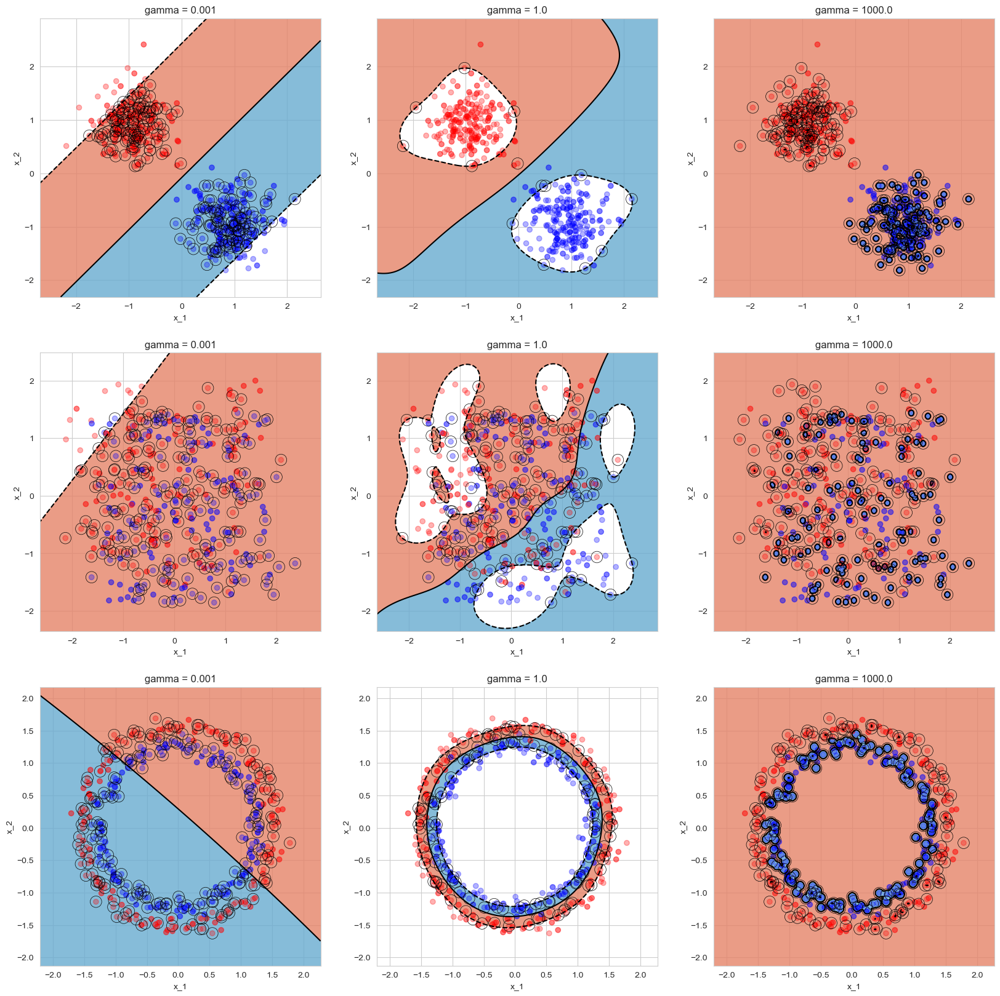

In [23]:
classifiers = []
name = []
# YOUR CODE HERE
gamma_list = np.logspace(-3, 3, num = 3)

for gamma in gamma_list:
    clf = SVC(kernel = 'rbf', C = 1, gamma = gamma)
    classifiers.append(clf)
    name.append('gamma = {}'.format(gamma))

svc_plotter(classifiers, name)